## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


# Camera Calibration

First, the camera calibration is done using chessboard images. in Code below the corners are found and shown on the chessboard images:

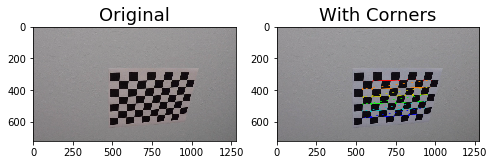

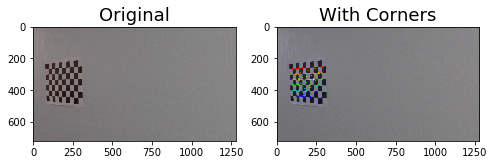

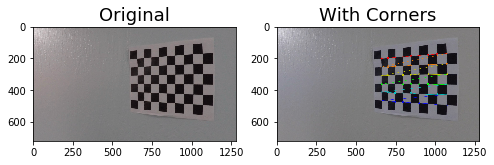

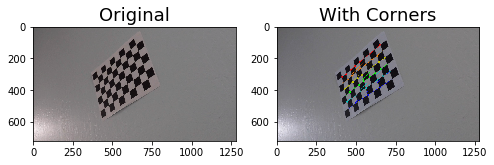

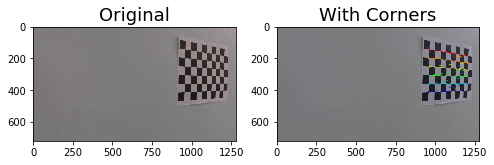

...

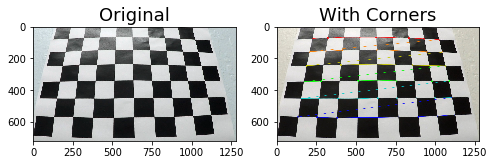

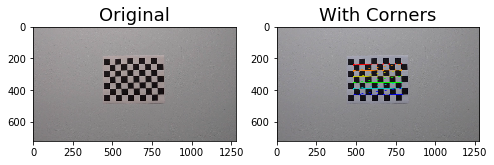

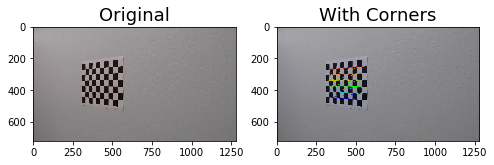

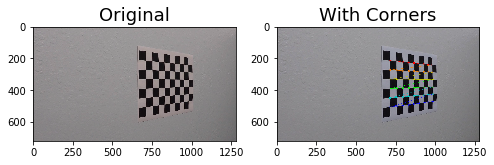

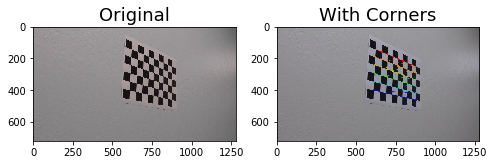

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# prepare object points,
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
images = glob.glob('camera_cal/calibration*.jpg')

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        # show image
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original', fontsize=18)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('With Corners', fontsize=18)
        
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

Then the camera calibration parameters are calculated and distortion is removed from images using cal_undistort function:

In [2]:
def cal_undistort(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)# Remove distortion from images
    
    return undist

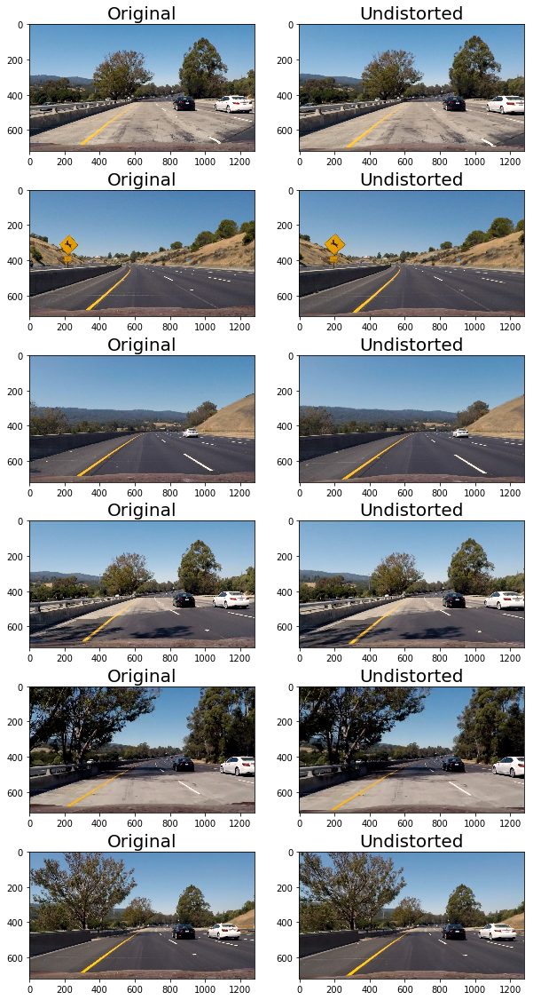

In [3]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    undist = cal_undistort(img)
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
    plt.title('Undistorted', fontsize=20)    
   

## Perspective Transformation

Then the perspective is transformed to get a bird's eye view of the road. To perform this transformation we can imagine a trnasformation from dash camera view (Trapezoid) to the bird's eye view (rectangle); the camera view is captured in src and the bird's eye view is represented by dst arrays:

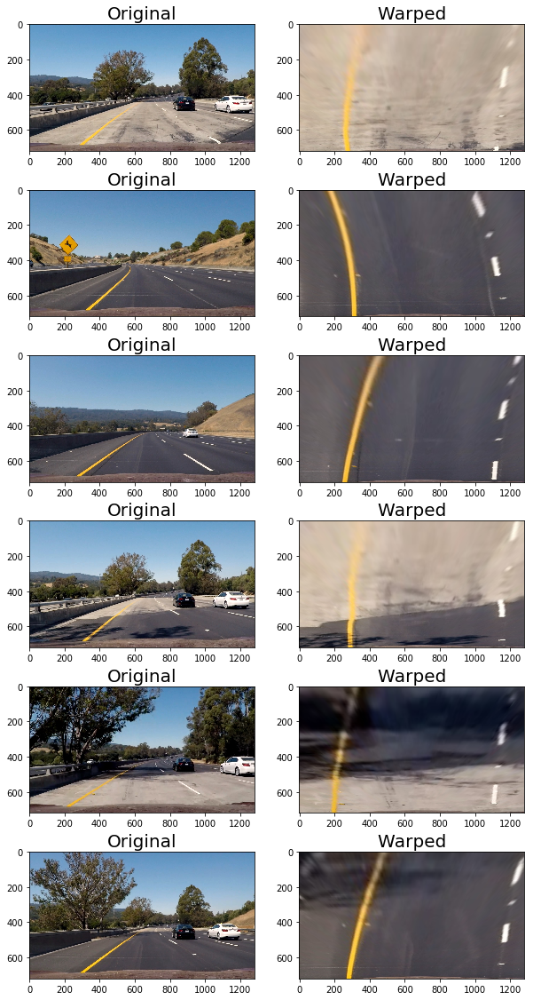

In [4]:
# Perform perspective transform
def Perspective_Trans(img):
    undist = cal_undistort(img)
    img_size = (undist.shape[1], undist.shape[0])
    offset = 0
    
    src = np.float32([[545, 460], [735, 460],
                    [1280, 700], [0, 700]])

    dst = np.float32([[0, 0], [1280, 0],
                     [1280, 720], [0, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)

    return warped, M

f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    warped, M = Perspective_Trans(img)
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    plt.title('Warped', fontsize=20) 
    

## Gradient Threshold

The function below calculates the gradient of the image in selected direction and applies thresholds:

In [5]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(abs_sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    #plt.imshow(sxbinary, cmap='gray')
    # 6) Return this mask as a binary_output image
    binary_output = sxbinary
    return binary_output

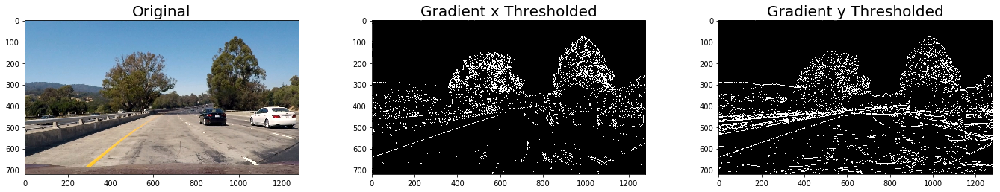

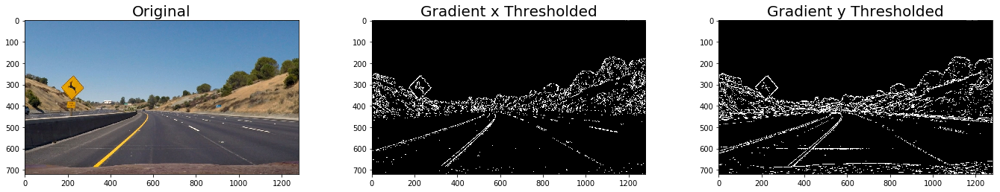

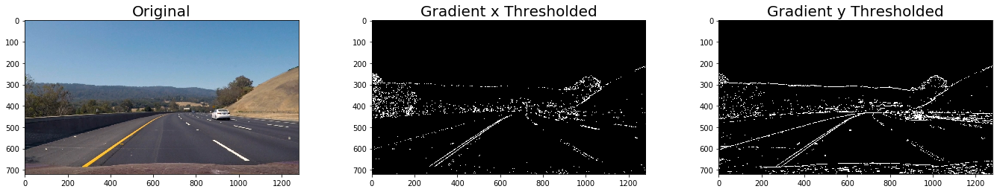

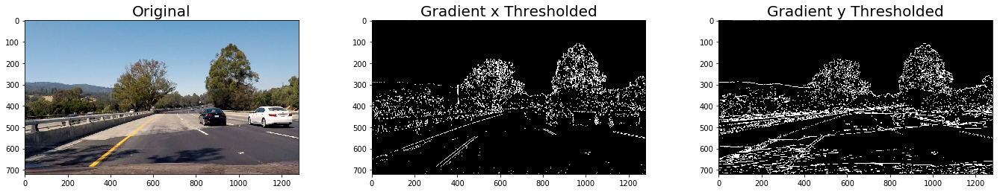

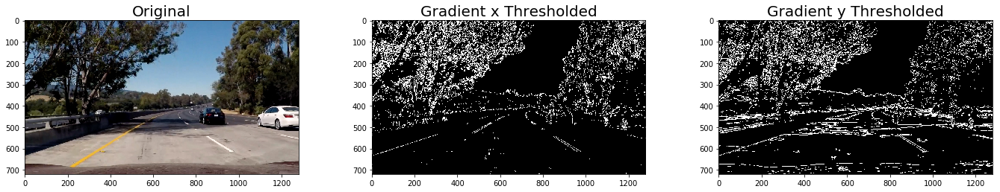

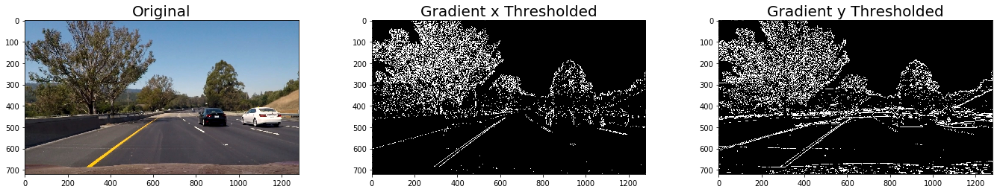

In [6]:
  
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original', fontsize=20)
    ax2.imshow(gradx, cmap='gray')
    ax2.set_title('Gradient x Thresholded', fontsize=20)
    ax3.imshow(grady, cmap='gray')
    ax3.set_title('Gradient y Thresholded', fontsize=20)    
    plt.subplots_adjust(left=0.0, right=2, top=1, bottom=0.)

## Magnitude of Gradient Thresholding

The fundtion below calculates the magnitude of the gradients and thresholds that:

In [7]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    abs_sobelxy = np.sqrt(abs_sobelx*abs_sobelx + abs_sobely*abs_sobely)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    sxybinary = np.zeros_like(scaled_sobel)
    sxybinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as the binary_output image
    binary_output = sxybinary
    return binary_output

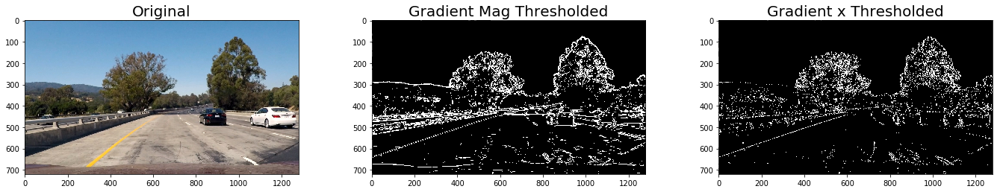

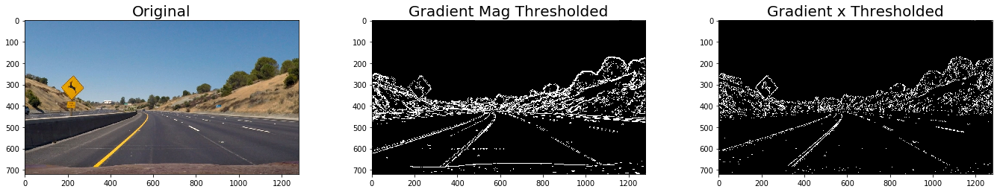

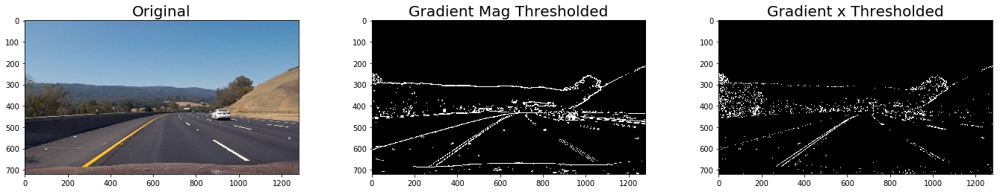

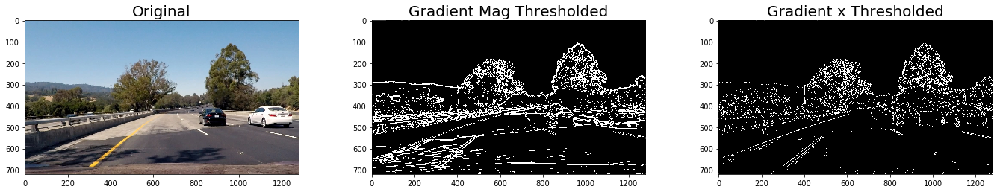

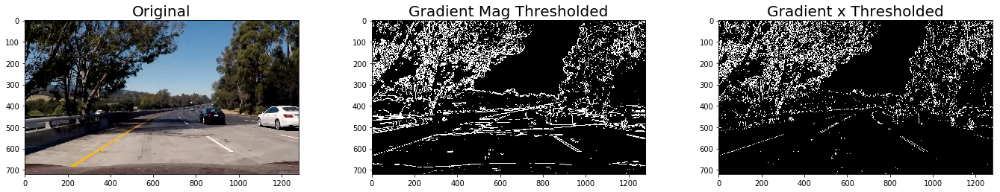

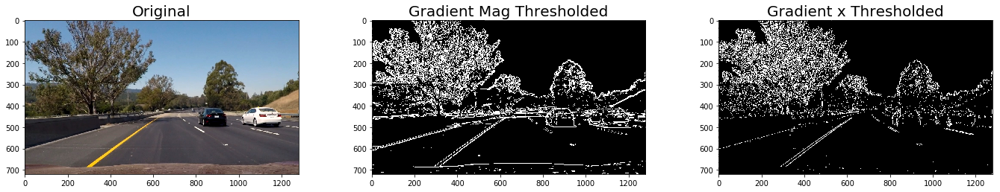

In [8]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original', fontsize=20)
    ax2.imshow(mag_binary, cmap='gray')
    ax2.set_title('Gradient Mag Thresholded', fontsize=20)
    ax3.imshow(gradx, cmap='gray')
    ax3.set_title('Gradient x Thresholded', fontsize=20)
    plt.subplots_adjust(left=0., right=2, top=1, bottom=0.) 

## Gradient Direction

The function below calculates the direction of gradient and thresholds that to just get the vertical lines (the ones that are close to what we're interested in):

In [9]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

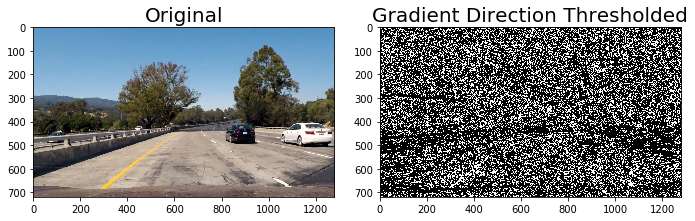

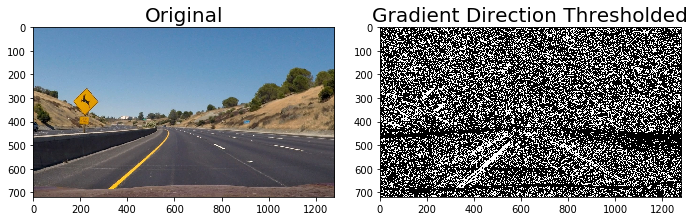

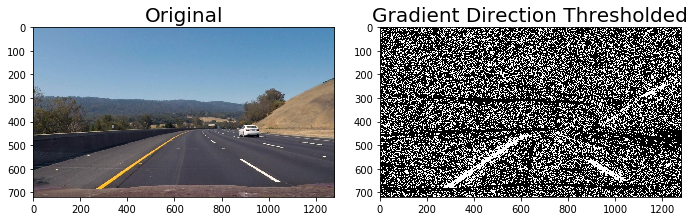

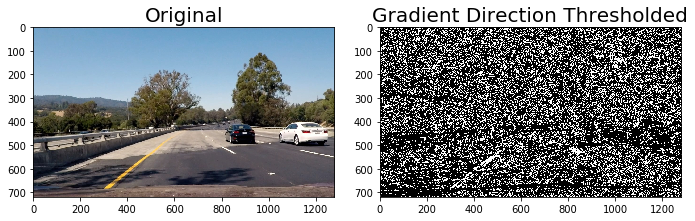

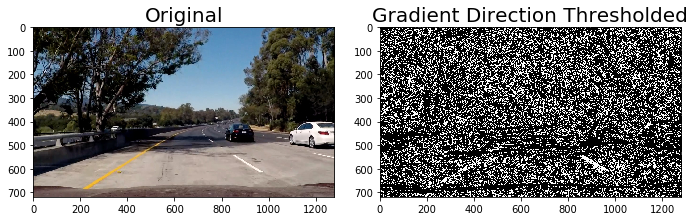

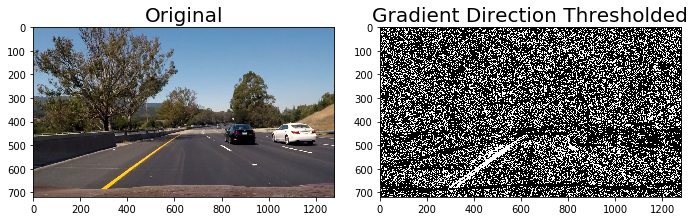

In [10]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original', fontsize=20)
    ax2.imshow(dir_binary, cmap='gray')
    ax2.set_title('Gradient Direction Thresholded', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=1, bottom=0.)

## Combining Gradient Thresholds

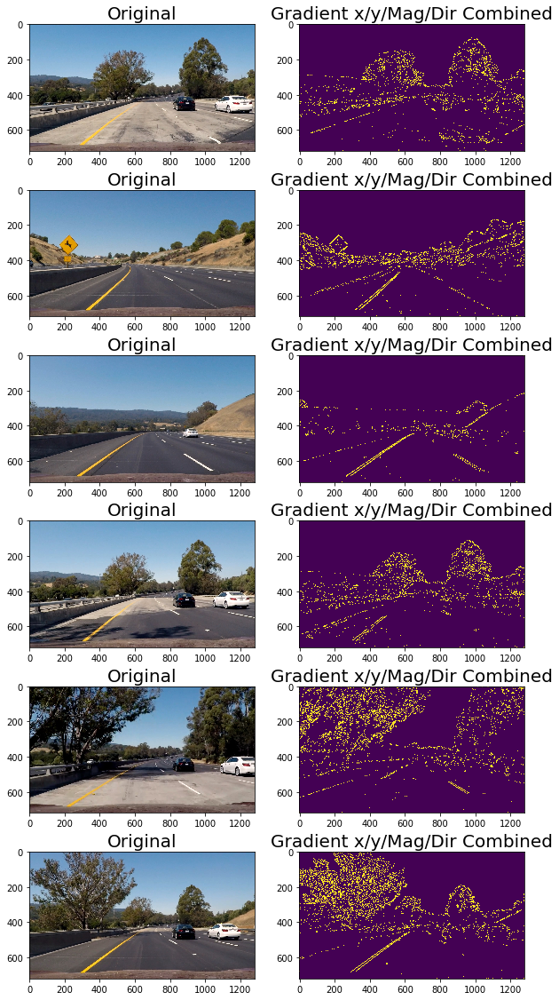

In [11]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    undist = cal_undistort(img)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1   
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(combined_binary)
    plt.title('Gradient x/y/Mag/Dir Combined', fontsize=20)   


## Color Thresholding:

The S channel is thresholded in function below:

In [12]:
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    binary_output = binary# np.copy(img) # placeholder line
    return binary_output    

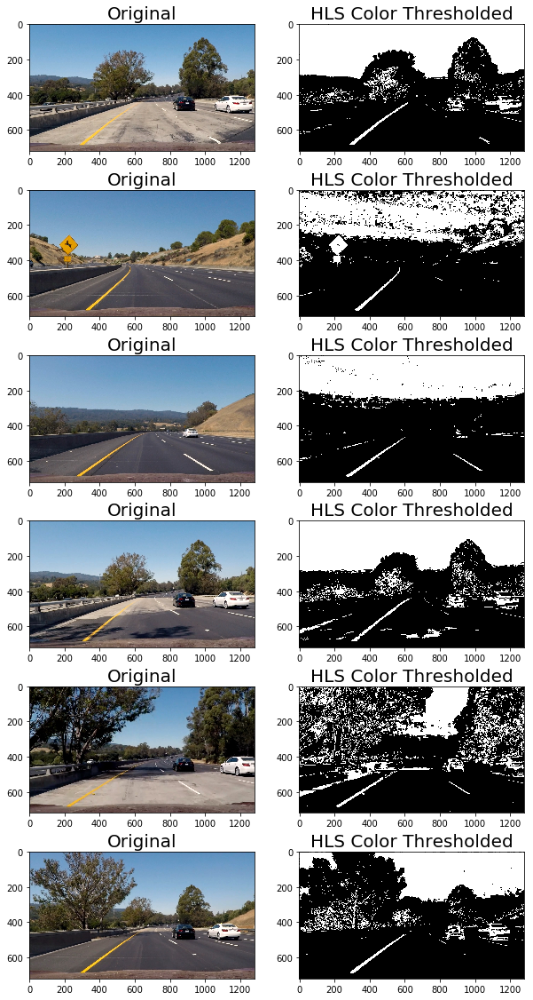

In [13]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    hls_binary = hls_select(img, thresh=(100, 255))
    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(hls_binary, cmap='gray')
    plt.title('HLS Color Thresholded', fontsize=20)
    

## Combining Gradient and Color Thresholds

C:\Users\Hojjat\AppData\Local\conda\conda\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:29: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


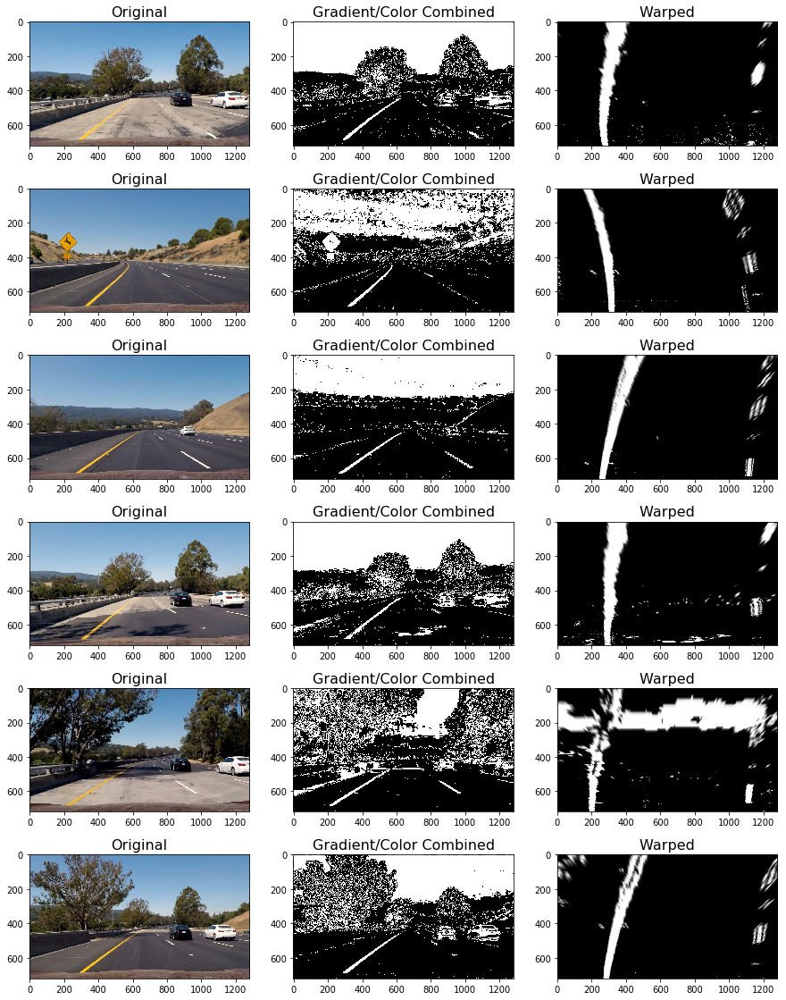

In [14]:
import scipy.misc

images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(15, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)

    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    warped, M = Perspective_Trans(combined_binary) 
    plt.subplot(6, 3, 3*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=16)
    plt.subplot(6, 3, 3*i+2)
    plt.imshow(combined_binary, cmap='gray')
    plt.title('Gradient/Color Combined', fontsize=16)
    plt.subplot(6, 3, 3*i+3)
    plt.imshow(warped, cmap='gray')
    plt.title('Warped', fontsize=16)    
    
    fname = 'combined_images\combined_binary'+ str(i)+'.jpg'
    scipy.misc.imsave(fname, combined_binary)
     

## Fitting Polynomial To Lane Lines

In [15]:
def fit_poly_lane(binary_warped):
    #binary_warped = warped#cv2.imread(image)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    #plt.plot(histogram) 

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    #print(left_lane_inds.shape)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    #findinf line radius
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])   
    
    return left_fit, right_fit, out_img, \
           left_curverad, right_curverad

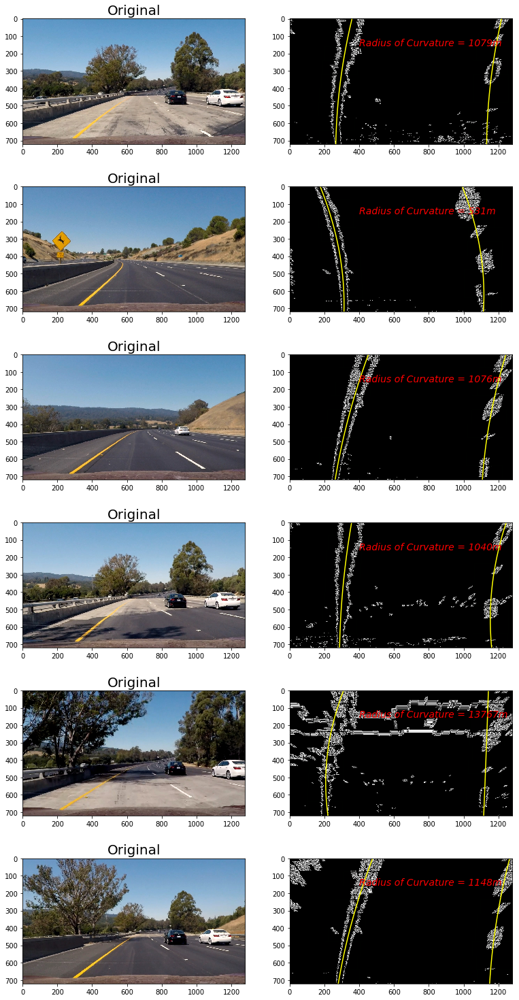

In [16]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
    left_fit, right_fit, out_img, left_curverad, right_curverad \
    = fit_poly_lane(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)
    plt.subplot(6, 2, 2*i+2)
    plt.imshow(out_img, cmap='gray')
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.text(400, 155, 'Radius of Curvature = {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='red', fontsize=14)    
    plt.subplots_adjust(left=0., right=1, top=1, bottom=0.)
   

In [17]:
def lane_filler(image):
   
    img = cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
    left_fit, right_fit, out_img, left_curverad, right_curverad \
    = fit_poly_lane(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    camera_position = img.shape[1]/2
    n=img.shape[0]
    center = abs(camera_position - ((left_fitx[n-1]+right_fitx[n-1])/2))*xm_per_pix
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[545, 460], [735, 460],
                    [1280, 700], [0, 700]])

    dst = np.float32([[0, 0], [1280, 0],
                     [1280, 720], [0, 720]])
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    lane_filled_image = cv2.addWeighted(mpimg.imread(image), 1, newwarp, 0.5, 0)
    
    return center, left_curverad, right_curverad, lane_filled_image
    

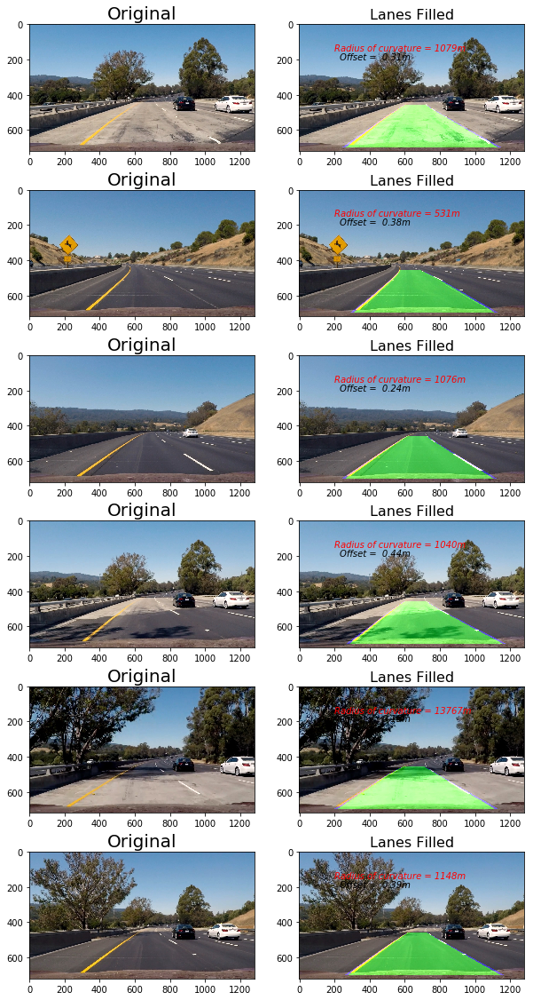

In [18]:
images = glob.glob('test_images/test*.jpg')
f=plt.figure(figsize=(10, 20))
for i, image in enumerate(images):
    img = cv2.imread(image)
    center, left_curverad, right_curverad, lane_filled_image = lane_filler(image)

    plt.subplot(6, 2, 2*i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original', fontsize=20)

    plt.subplot(6, 2, 2*i+2)
    plt.imshow(lane_filled_image)
    plt.title('Lanes Filled', fontsize=16)
    plt.text(200, 150, 'Radius of curvature = {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='red', fontsize=10)
    plt.text(230, 200, 'Offset = {:5.2f}m'.format(center), style='italic', color='black', fontsize=10)
             

# Video Processing

In [19]:
def video_processor(image):
    img_size = (image.shape[1], image.shape[0])

    # Calibrate camera and undistort image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    #find lanes
    img = undist # cv2.imread(image)
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    hls_binary = hls_select(img, thresh=(100, 255))
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
    left_fit, right_fit, out_img, left_curverad, right_curverad \
    = fit_poly_lane(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    camera_position = img.shape[1]/2
    n=img.shape[0]
    center = abs(camera_position - ((left_fitx[n-1]+right_fitx[n-1])/2))*xm_per_pix
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[545, 460], [735, 460],
                    [1280, 700], [0, 700]])

    dst = np.float32([[0, 0], [1280, 0],
                     [1280, 720], [0, 720]])   
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    lane_filled_image = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)    
        
    # Print radius of curvature on video
    cv2.putText(lane_filled_image, 'Radius of Curvature {}(m)'.format(int((left_curverad+right_curverad)/2)), (150,150),
             fontFace = 16, fontScale = 2, color=(255,0,0), thickness = 2)
    cv2.putText(lane_filled_image, 'Offset = {:5.2f}m'.format(center), (200,200),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)

    return lane_filled_image

In [20]:
def select_yellow(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower = np.array([20,60,60])
    upper = np.array([38,174, 250])
    mask = cv2.inRange(hsv, lower, upper)

    return mask

def select_white(image):
    lower = np.array([202,202,202])
    upper = np.array([255,255,255])
    mask = cv2.inRange(image, lower, upper)

    return mask

def comb_thresh(image):
  yellow = select_yellow(image)
  white = select_white(image)

  combined_binary = np.zeros_like(yellow)
  combined_binary[(yellow >= 1) | (white >= 1)] = 1

  return combined_binary

def video_processor2(image):
    img_size = (image.shape[1], image.shape[0])

    # Calibrate camera and undistort image
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    
    #find lanes
    #img = undist # cv2.imread(image)
    #gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    #grady = abs_sobel_thresh(img, orient='y', thresh_min=20, thresh_max=100)    
    #dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.2))
    #mag_binary = mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100))
    #hls_binary = hls_select(img, thresh=(100, 255))
    
    #combined_binary = np.zeros_like(dir_binary)
    #combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (hls_binary == 1)] = 1
    
    combined_binary = comb_thresh(undist)
    
    binary_warped, M = Perspective_Trans(combined_binary)
    
    left_fit, right_fit, out_img, left_curverad, right_curverad \
    = fit_poly_lane(binary_warped)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    camera_position = img.shape[1]/2
    n=img.shape[0]
    center = abs(camera_position - ((left_fitx[n-1]+right_fitx[n-1])/2))*xm_per_pix
    
    offset = 0 
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([[545, 460], [735, 460],
                    [1280, 700], [0, 700]])

    dst = np.float32([[0, 0], [1280, 0],
                     [1280, 720], [0, 720]])   
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (combined_binary.shape[1], combined_binary.shape[0]))
    lane_filled_image = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)    
        
    # Print radius of curvature on video
    cv2.putText(lane_filled_image, 'Radius of Curvature {}(m)'.format(int((left_curverad+right_curverad)/2)), (150,150),
             fontFace = 16, fontScale = 2, color=(255,0,0), thickness = 2)
    cv2.putText(lane_filled_image, 'Offset = {:5.2f}m'.format(center), (200,200),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)

    return lane_filled_image

In [23]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'harder_challenge_video_out.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")#.subclip(0,2)
#video_clip.reader.close()
#video_clip.audio.reader.close_proc()
white_clip = clip1.fl_image(video_processor) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4




  0%|                                                                                                       | 0/1200 [00:00<?, ?it/s]

  0%|                                                                                               | 1/1200 [00:00<10:43,  1.86it/s]

  0%|▏                                                                                              | 2/1200 [00:01<10:39,  1.87it/s]

  0%|▏                                                                                              | 3/1200 [00:01<10:34,  1.89it/s]

  0%|▎                                                                                              | 4/1200 [00:02<10:31,  1.89it/s]

  0%|▍                                                                                              | 5/1200 [00:02<10:41,  1.86it/s]

  0%|▍                                                                                              | 6/1200 [00:03<11:04,  1.80it/s]

  1%|▌                                               

  5%|████▋                                                                                         | 60/1200 [00:37<12:47,  1.49it/s]

  5%|████▊                                                                                         | 61/1200 [00:37<12:51,  1.48it/s]

  5%|████▊                                                                                         | 62/1200 [00:38<12:43,  1.49it/s]

  5%|████▉                                                                                         | 63/1200 [00:39<12:27,  1.52it/s]

  5%|█████                                                                                         | 64/1200 [00:39<12:10,  1.56it/s]

  5%|█████                                                                                         | 65/1200 [00:40<11:58,  1.58it/s]

  6%|█████▏                                                                                        | 66/1200 [00:40<11:44,  1.61it/s]

  6%|█████▏                                            

 10%|█████████▎                                                                                   | 120/1200 [01:12<10:22,  1.74it/s]

 10%|█████████▍                                                                                   | 121/1200 [01:13<10:22,  1.73it/s]

 10%|█████████▍                                                                                   | 122/1200 [01:13<10:32,  1.70it/s]

 10%|█████████▌                                                                                   | 123/1200 [01:14<10:34,  1.70it/s]

 10%|█████████▌                                                                                   | 124/1200 [01:14<10:40,  1.68it/s]

 10%|█████████▋                                                                                   | 125/1200 [01:15<10:34,  1.70it/s]

 10%|█████████▊                                                                                   | 126/1200 [01:16<10:39,  1.68it/s]

 11%|█████████▊                                        

 15%|█████████████▉                                                                               | 180/1200 [01:46<09:33,  1.78it/s]

 15%|██████████████                                                                               | 181/1200 [01:47<09:28,  1.79it/s]

 15%|██████████████                                                                               | 182/1200 [01:47<09:29,  1.79it/s]

 15%|██████████████▏                                                                              | 183/1200 [01:48<09:48,  1.73it/s]

 15%|██████████████▎                                                                              | 184/1200 [01:48<10:02,  1.69it/s]

 15%|██████████████▎                                                                              | 185/1200 [01:49<09:47,  1.73it/s]

 16%|██████████████▍                                                                              | 186/1200 [01:49<09:46,  1.73it/s]

 16%|██████████████▍                                   

 20%|██████████████████▌                                                                          | 240/1200 [02:25<10:30,  1.52it/s]

 20%|██████████████████▋                                                                          | 241/1200 [02:26<10:34,  1.51it/s]

 20%|██████████████████▊                                                                          | 242/1200 [02:26<10:35,  1.51it/s]

 20%|██████████████████▊                                                                          | 243/1200 [02:27<10:21,  1.54it/s]

 20%|██████████████████▉                                                                          | 244/1200 [02:27<10:17,  1.55it/s]

 20%|██████████████████▉                                                                          | 245/1200 [02:28<10:21,  1.54it/s]

 20%|███████████████████                                                                          | 246/1200 [02:29<10:26,  1.52it/s]

 21%|███████████████████▏                              

 25%|███████████████████████▎                                                                     | 300/1200 [03:02<08:53,  1.69it/s]

 25%|███████████████████████▎                                                                     | 301/1200 [03:03<08:47,  1.71it/s]

 25%|███████████████████████▍                                                                     | 302/1200 [03:03<08:49,  1.70it/s]

 25%|███████████████████████▍                                                                     | 303/1200 [03:04<08:43,  1.71it/s]

 25%|███████████████████████▌                                                                     | 304/1200 [03:05<08:41,  1.72it/s]

 25%|███████████████████████▋                                                                     | 305/1200 [03:05<08:45,  1.70it/s]

 26%|███████████████████████▋                                                                     | 306/1200 [03:06<08:46,  1.70it/s]

 26%|███████████████████████▊                          

 30%|███████████████████████████▉                                                                 | 360/1200 [03:37<08:03,  1.74it/s]

 30%|███████████████████████████▉                                                                 | 361/1200 [03:37<08:05,  1.73it/s]

 30%|████████████████████████████                                                                 | 362/1200 [03:38<08:11,  1.70it/s]

 30%|████████████████████████████▏                                                                | 363/1200 [03:39<08:20,  1.67it/s]

 30%|████████████████████████████▏                                                                | 364/1200 [03:39<08:13,  1.69it/s]

 30%|████████████████████████████▎                                                                | 365/1200 [03:40<08:15,  1.69it/s]

 30%|████████████████████████████▎                                                                | 366/1200 [03:40<08:25,  1.65it/s]

 31%|████████████████████████████▍                     

 35%|████████████████████████████████▌                                                            | 420/1200 [04:15<08:19,  1.56it/s]

 35%|████████████████████████████████▋                                                            | 421/1200 [04:16<08:18,  1.56it/s]

 35%|████████████████████████████████▋                                                            | 422/1200 [04:16<08:20,  1.55it/s]

 35%|████████████████████████████████▊                                                            | 423/1200 [04:17<08:20,  1.55it/s]

 35%|████████████████████████████████▊                                                            | 424/1200 [04:18<08:13,  1.57it/s]

 35%|████████████████████████████████▉                                                            | 425/1200 [04:18<08:13,  1.57it/s]

 36%|█████████████████████████████████                                                            | 426/1200 [04:19<08:12,  1.57it/s]

 36%|█████████████████████████████████                 

 40%|█████████████████████████████████████▏                                                       | 480/1200 [04:51<06:38,  1.81it/s]

 40%|█████████████████████████████████████▎                                                       | 481/1200 [04:52<06:38,  1.80it/s]

 40%|█████████████████████████████████████▎                                                       | 482/1200 [04:53<06:44,  1.77it/s]

 40%|█████████████████████████████████████▍                                                       | 483/1200 [04:53<06:43,  1.78it/s]

 40%|█████████████████████████████████████▌                                                       | 484/1200 [04:54<06:44,  1.77it/s]

 40%|█████████████████████████████████████▌                                                       | 485/1200 [04:54<06:38,  1.80it/s]

 40%|█████████████████████████████████████▋                                                       | 486/1200 [04:55<06:43,  1.77it/s]

 41%|█████████████████████████████████████▋            

 45%|█████████████████████████████████████████▊                                                   | 540/1200 [05:25<06:08,  1.79it/s]

 45%|█████████████████████████████████████████▉                                                   | 541/1200 [05:26<06:09,  1.78it/s]

 45%|██████████████████████████████████████████                                                   | 542/1200 [05:26<06:10,  1.78it/s]

 45%|██████████████████████████████████████████                                                   | 543/1200 [05:27<06:09,  1.78it/s]

 45%|██████████████████████████████████████████▏                                                  | 544/1200 [05:27<06:10,  1.77it/s]

 45%|██████████████████████████████████████████▏                                                  | 545/1200 [05:28<06:09,  1.77it/s]

 46%|██████████████████████████████████████████▎                                                  | 546/1200 [05:28<06:07,  1.78it/s]

 46%|██████████████████████████████████████████▍       

 50%|██████████████████████████████████████████████▌                                              | 600/1200 [05:59<05:45,  1.73it/s]

 50%|██████████████████████████████████████████████▌                                              | 601/1200 [05:59<05:47,  1.72it/s]

 50%|██████████████████████████████████████████████▋                                              | 602/1200 [06:00<05:43,  1.74it/s]

 50%|██████████████████████████████████████████████▋                                              | 603/1200 [06:00<05:41,  1.75it/s]

 50%|██████████████████████████████████████████████▊                                              | 604/1200 [06:01<05:35,  1.78it/s]

 50%|██████████████████████████████████████████████▉                                              | 605/1200 [06:02<05:35,  1.77it/s]

 50%|██████████████████████████████████████████████▉                                              | 606/1200 [06:02<05:31,  1.79it/s]

 51%|███████████████████████████████████████████████   

 55%|███████████████████████████████████████████████████▏                                         | 660/1200 [06:36<06:06,  1.47it/s]

 55%|███████████████████████████████████████████████████▏                                         | 661/1200 [06:37<06:03,  1.48it/s]

 55%|███████████████████████████████████████████████████▎                                         | 662/1200 [06:38<06:01,  1.49it/s]

 55%|███████████████████████████████████████████████████▍                                         | 663/1200 [06:38<05:59,  1.49it/s]

 55%|███████████████████████████████████████████████████▍                                         | 664/1200 [06:39<06:01,  1.48it/s]

 55%|███████████████████████████████████████████████████▌                                         | 665/1200 [06:40<06:00,  1.48it/s]

 56%|███████████████████████████████████████████████████▌                                         | 666/1200 [06:40<06:08,  1.45it/s]

 56%|██████████████████████████████████████████████████

 60%|███████████████████████████████████████████████████████▊                                     | 720/1200 [07:18<05:36,  1.42it/s]

 60%|███████████████████████████████████████████████████████▉                                     | 721/1200 [07:19<05:19,  1.50it/s]

 60%|███████████████████████████████████████████████████████▉                                     | 722/1200 [07:19<05:12,  1.53it/s]

 60%|████████████████████████████████████████████████████████                                     | 723/1200 [07:20<05:30,  1.44it/s]

 60%|████████████████████████████████████████████████████████                                     | 724/1200 [07:21<05:34,  1.42it/s]

 60%|████████████████████████████████████████████████████████▏                                    | 725/1200 [07:21<05:18,  1.49it/s]

 60%|████████████████████████████████████████████████████████▎                                    | 726/1200 [07:22<05:08,  1.54it/s]

 61%|██████████████████████████████████████████████████

 65%|████████████████████████████████████████████████████████████▍                                | 780/1200 [07:57<04:16,  1.64it/s]

 65%|████████████████████████████████████████████████████████████▌                                | 781/1200 [07:57<04:16,  1.63it/s]

 65%|████████████████████████████████████████████████████████████▌                                | 782/1200 [07:58<04:20,  1.61it/s]

 65%|████████████████████████████████████████████████████████████▋                                | 783/1200 [07:59<04:19,  1.61it/s]

 65%|████████████████████████████████████████████████████████████▊                                | 784/1200 [07:59<04:16,  1.62it/s]

 65%|████████████████████████████████████████████████████████████▊                                | 785/1200 [08:00<04:22,  1.58it/s]

 66%|████████████████████████████████████████████████████████████▉                                | 786/1200 [08:01<04:23,  1.57it/s]

 66%|██████████████████████████████████████████████████

 70%|█████████████████████████████████████████████████████████████████                            | 840/1200 [08:37<03:39,  1.64it/s]

 70%|█████████████████████████████████████████████████████████████████▏                           | 841/1200 [08:38<03:39,  1.64it/s]

 70%|█████████████████████████████████████████████████████████████████▎                           | 842/1200 [08:39<03:37,  1.65it/s]

 70%|█████████████████████████████████████████████████████████████████▎                           | 843/1200 [08:39<03:41,  1.61it/s]

 70%|█████████████████████████████████████████████████████████████████▍                           | 844/1200 [08:40<03:36,  1.64it/s]

 70%|█████████████████████████████████████████████████████████████████▍                           | 845/1200 [08:41<03:39,  1.62it/s]

 70%|█████████████████████████████████████████████████████████████████▌                           | 846/1200 [08:41<03:48,  1.55it/s]

 71%|██████████████████████████████████████████████████

 75%|█████████████████████████████████████████████████████████████████████▊                       | 900/1200 [09:21<03:50,  1.30it/s]

 75%|█████████████████████████████████████████████████████████████████████▊                       | 901/1200 [09:22<04:13,  1.18it/s]

 75%|█████████████████████████████████████████████████████████████████████▉                       | 902/1200 [09:22<04:13,  1.17it/s]

 75%|█████████████████████████████████████████████████████████████████████▉                       | 903/1200 [09:23<04:08,  1.19it/s]

 75%|██████████████████████████████████████████████████████████████████████                       | 904/1200 [09:24<03:42,  1.33it/s]

 75%|██████████████████████████████████████████████████████████████████████▏                      | 905/1200 [09:24<03:25,  1.44it/s]

 76%|██████████████████████████████████████████████████████████████████████▏                      | 906/1200 [09:25<03:10,  1.54it/s]

 76%|██████████████████████████████████████████████████

 80%|██████████████████████████████████████████████████████████████████████████▍                  | 960/1200 [09:57<02:11,  1.82it/s]

 80%|██████████████████████████████████████████████████████████████████████████▍                  | 961/1200 [09:58<02:11,  1.82it/s]

 80%|██████████████████████████████████████████████████████████████████████████▌                  | 962/1200 [09:58<02:10,  1.82it/s]

 80%|██████████████████████████████████████████████████████████████████████████▋                  | 963/1200 [09:59<02:09,  1.83it/s]

 80%|██████████████████████████████████████████████████████████████████████████▋                  | 964/1200 [09:59<02:07,  1.85it/s]

 80%|██████████████████████████████████████████████████████████████████████████▊                  | 965/1200 [10:00<02:07,  1.85it/s]

 80%|██████████████████████████████████████████████████████████████████████████▊                  | 966/1200 [10:00<02:05,  1.86it/s]

 81%|██████████████████████████████████████████████████

 85%|██████████████████████████████████████████████████████████████████████████████▏             | 1020/1200 [10:33<01:38,  1.82it/s]

 85%|██████████████████████████████████████████████████████████████████████████████▎             | 1021/1200 [10:33<01:37,  1.84it/s]

 85%|██████████████████████████████████████████████████████████████████████████████▎             | 1022/1200 [10:34<01:37,  1.82it/s]

 85%|██████████████████████████████████████████████████████████████████████████████▍             | 1023/1200 [10:34<01:38,  1.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████▌             | 1024/1200 [10:35<01:38,  1.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████▌             | 1025/1200 [10:35<01:38,  1.79it/s]

 86%|██████████████████████████████████████████████████████████████████████████████▋             | 1026/1200 [10:36<01:38,  1.77it/s]

 86%|██████████████████████████████████████████████████

 90%|██████████████████████████████████████████████████████████████████████████████████▊         | 1080/1200 [11:10<01:13,  1.63it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████▉         | 1081/1200 [11:11<01:13,  1.63it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████▉         | 1082/1200 [11:11<01:12,  1.63it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████         | 1083/1200 [11:12<01:12,  1.62it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████         | 1084/1200 [11:13<01:10,  1.64it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████▏        | 1085/1200 [11:13<01:11,  1.61it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████▎        | 1086/1200 [11:14<01:11,  1.59it/s]

 91%|██████████████████████████████████████████████████

 95%|███████████████████████████████████████████████████████████████████████████████████████▍    | 1140/1200 [11:51<00:39,  1.52it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████▍    | 1141/1200 [11:52<00:37,  1.56it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████▌    | 1142/1200 [11:53<00:36,  1.60it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████▋    | 1143/1200 [11:53<00:36,  1.54it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████▋    | 1144/1200 [11:54<00:36,  1.52it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████▊    | 1145/1200 [11:55<00:36,  1.50it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████▊    | 1146/1200 [11:55<00:35,  1.53it/s]

 96%|██████████████████████████████████████████████████

[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

